In [1]:
import scipy
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from tqdm import tqdm
from epidemics_func import PreferentialAttachment, Infection, InfectionV, Recovery, Epidemic, Epidemicw, Vaccinated, GradientOptimizer

### Problem 1

In [3]:
#init
n=500
states = []

#we create thr k-regilar matrix by shifting row elements in each row of adjacancy matrix
W=[]
v = np.zeros(n)
v[1] = 1
v[2] = 1
v[-1] = 1
v[-2] = 1
for i in range(n):
    W.append(v)
    v = np.roll(v, 1)
    
W=np.array(W).astype(int)

#sparse
W = csr_matrix(W)

In [6]:
states, newinfections = Epidemicw(W, n = 500, init_inf_nodes = 10, beta = 0.3, ro = 0.7, num_simul = 100, steps = 15)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [01:03<00:00,  1.58it/s]


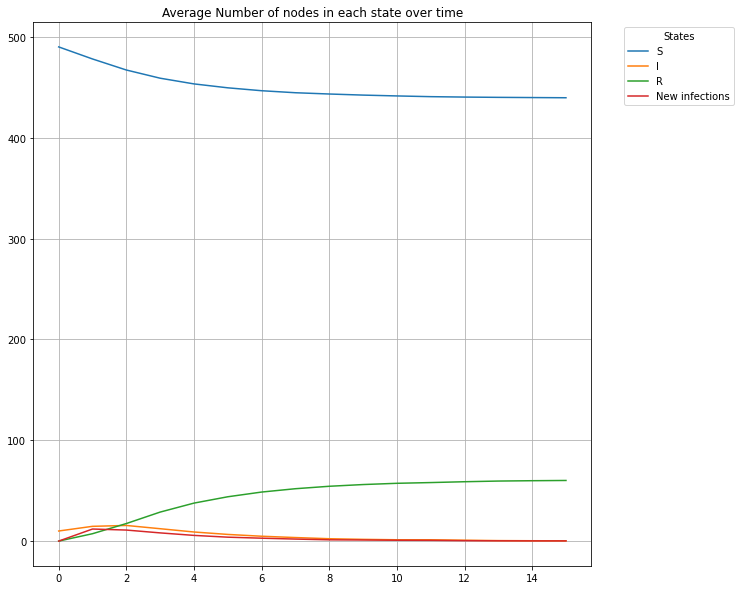

In [8]:
plt.figure(0, figsize=(10, 10))
plt.title("Average Number of nodes in each state over time")
plt.grid()
plt.plot(range(16), np.mean(states, axis = 0)[:, 0], label = "S")
plt.plot(range(16), np.mean(states, axis = 0)[:, 1], label = "I")
plt.plot(range(16), np.mean(states, axis = 0)[:, 2], label = "R")
plt.plot(range(16), np.mean(newinfections, axis = 0), label='New infections')
plt.legend(title='States', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [9]:
G = PreferentialAttachment(6, 1000)

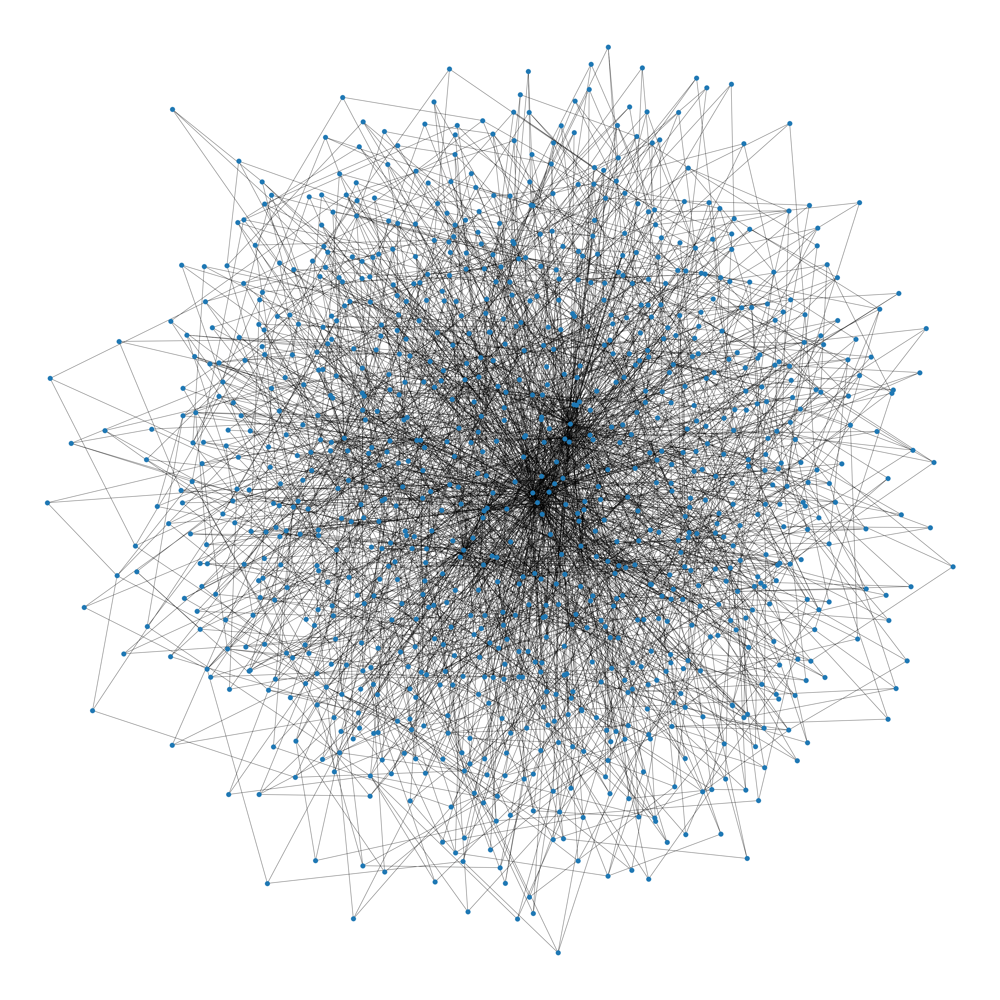

In [10]:
plt.figure(figsize=(50,50))
nx.draw(G, with_labels = False)

### Problem 2

In [20]:
#following the algorithm used in previous section we generate our random graph
G = PreferentialAttachment(k = 6, n_nodes = 500)
W = nx.adjacency_matrix(G)
statess, newinfectionss = Epidemicw(W, n = len(G), init_inf_nodes = 10, beta = 0.3, ro = 0.7, num_simul = 100, steps = 15)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:30<00:00,  3.30it/s]


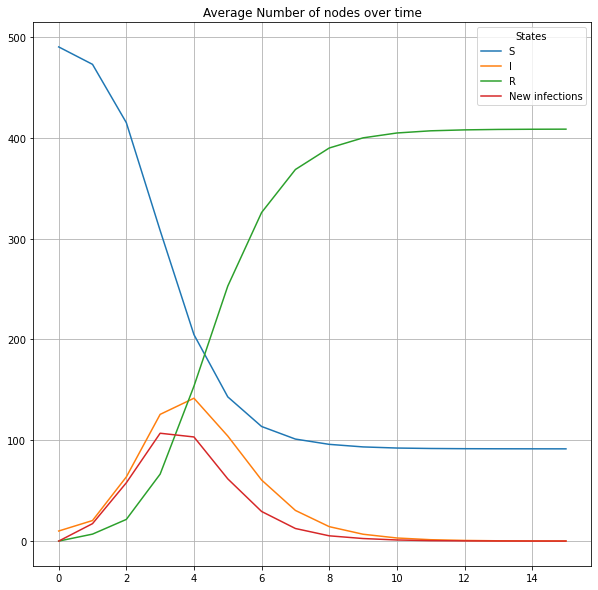

In [21]:
plt.figure(0, figsize=(10, 10))
plt.title("Average Number of nodes over time")
plt.grid()
plt.plot(range(16), np.mean(statess, axis = 0)[:, 0], label = "S")
plt.plot(range(16), np.mean(statess, axis = 0)[:, 1], label = "I")
plt.plot(range(16), np.mean(statess, axis = 0)[:, 2], label = "R")
plt.plot(range(16), np.mean(newinfectionss, axis = 0), label='New infections')
plt.legend(title='States', loc='upper right')
plt.show()

### Problem 3

In [25]:
#following the algorithm used in previous section we generate our random graph
vaccine_schedule = [0, 5, 15, 25, 35, 45, 55, 60, 60, 60, 60, 60, 60, 60, 60]
statesv, newinfectionsv, mean, rsme = Epidemic(k=6, n = 500, init_inf_nodes = 10, beta = 0.3, ro = 0.7, num_simul = 100, steps = 16, vaccine = vaccine_schedule)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:30<00:00,  3.28it/s]


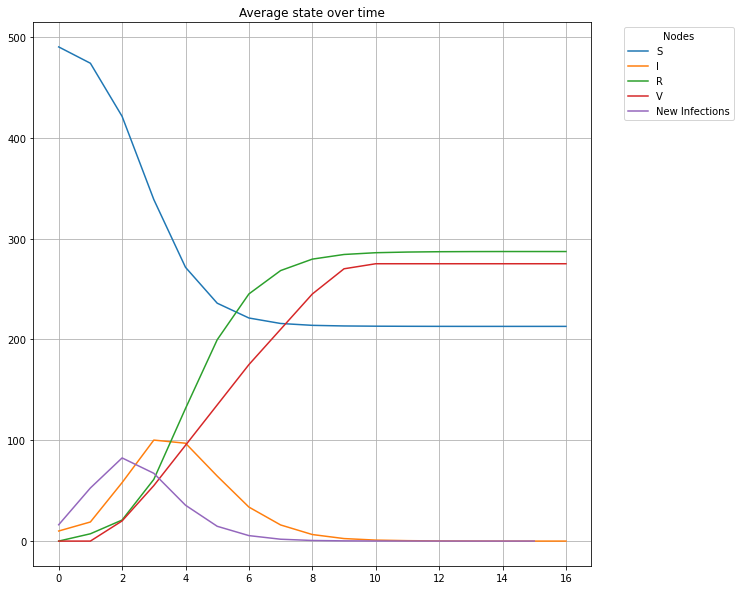

In [26]:
plt.figure(0, figsize=(10, 10))
plt.title("Average state over time")
plt.grid()
plt.plot(np.mean(statesv, axis = 0)[:, 1], label = "S")
plt.plot(np.mean(statesv, axis = 0)[:, 2], label = "I")
plt.plot(np.mean(statesv, axis = 0)[:, 3], label = "R")
plt.plot(np.mean(statesv, axis = 0)[:, 4], label = "V")
plt.plot(np.mean(newinfectionsv, axis = 0), label = "New Infections")
plt.legend(title='Nodes', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

### Problem 4

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Starting Parameters with k=10, beta=0.3, ro=0.6


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:20<00:00,  4.76it/s]

Best RMSE located : 26.5 at: beta=0.2 k=8 ro=0.7


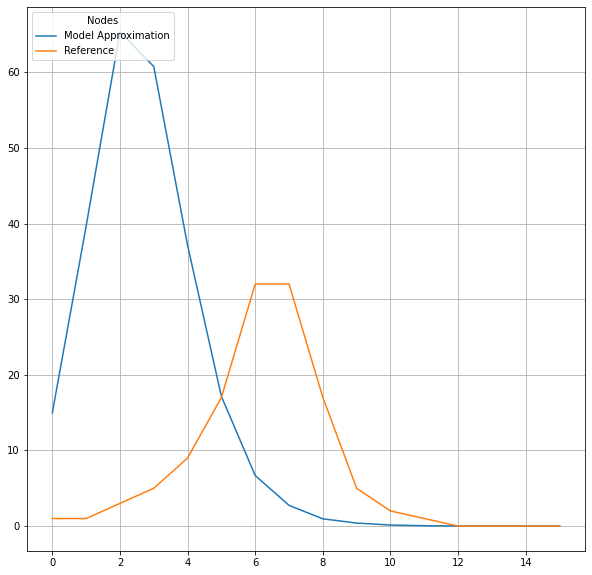

Moving Local Optima
Starting Parameters with k=8, beta=0.2, ro=0.7


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:30<00:00,  3.26it/s]

Best RMSE located : 12.2 at: beta=0.1 k=8 ro=0.7


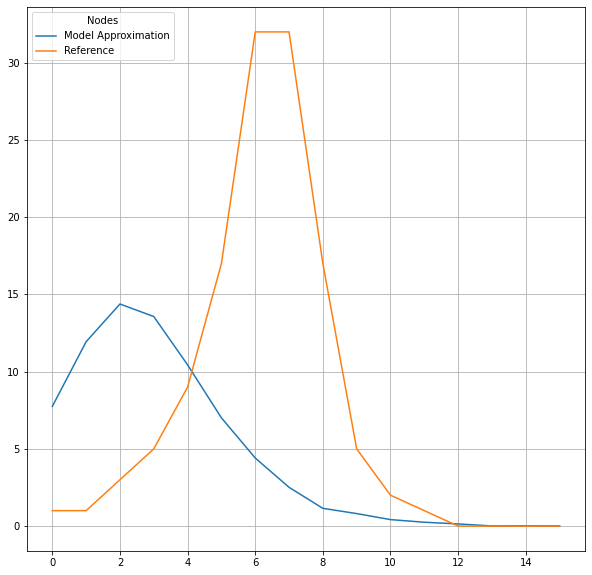

Moving Local Optima
Starting Parameters with k=8, beta=0.1, ro=0.7


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:40<00:00,  2.50it/s]

Best RMSE located : 12 at: beta=0.1 k=8 ro=0.6


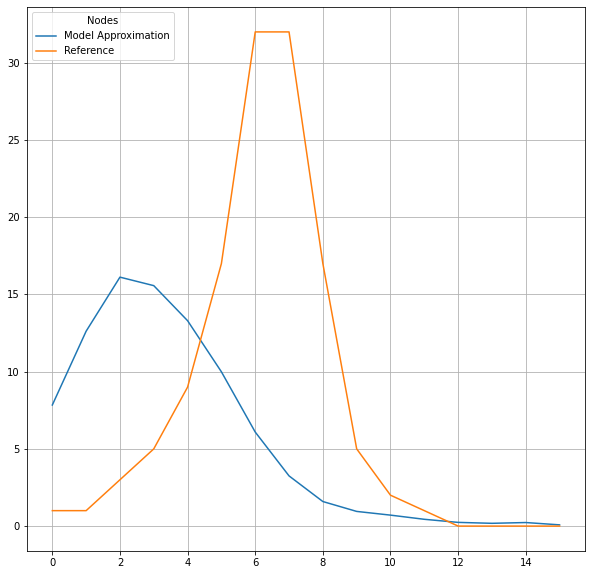

Moving Local Optima
Starting Parameters with k=8, beta=0.1, ro=0.6


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:38<00:00,  2.61it/s]

Best RMSE located : 11.7 at: beta=0.1 k=6 ro=0.5


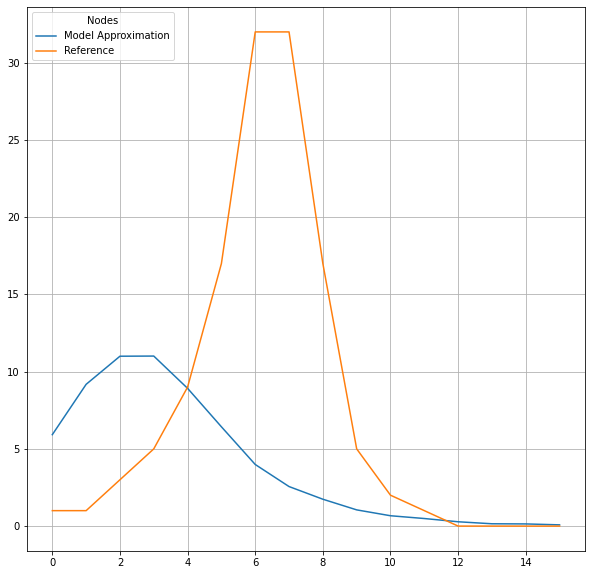

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.5


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:37<00:00,  2.67it/s]

Best RMSE located : 10.9 at: beta=0.1 k=6 ro=0.4


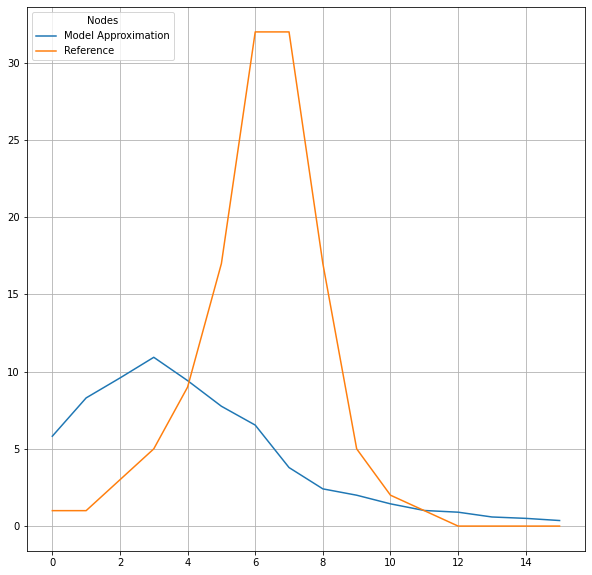

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.4


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:36<00:00,  2.75it/s]

Best RMSE located : 10.6 at: beta=0.1 k=6 ro=0.3


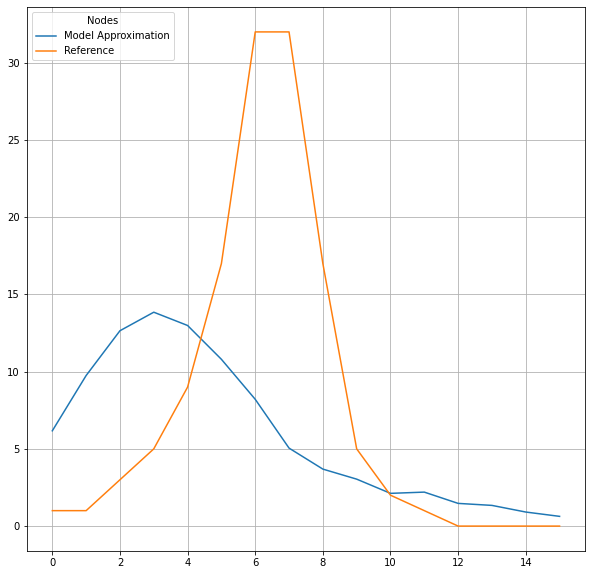

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.3


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:34<00:00,  2.89it/s]

Best RMSE located : 9.97 at: beta=0.1 k=6 ro=0.2


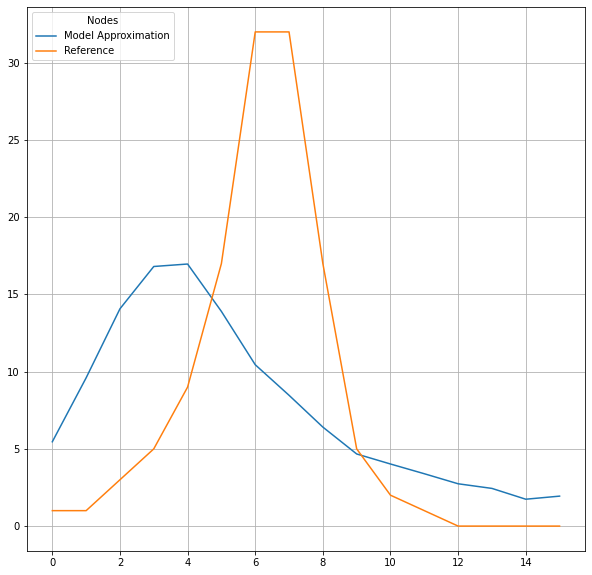

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.2


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:33<00:00,  3.00it/s]

Best RMSE located : 9.49 at: beta=0.1 k=6 ro=0.1


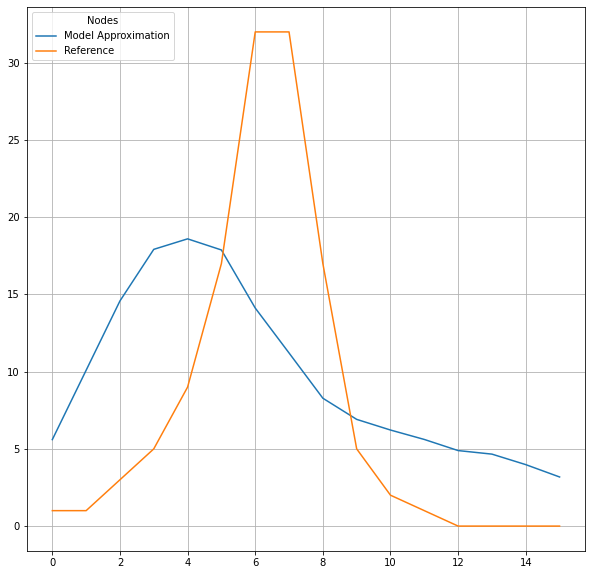

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.1


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

updating precision
Starting Parameters with k=6, beta=0.1, ro=0.1


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:34<00:00,  2.90it/s]

Best RMSE located : 9.45 at: beta=0.1 k=5 ro=0.05


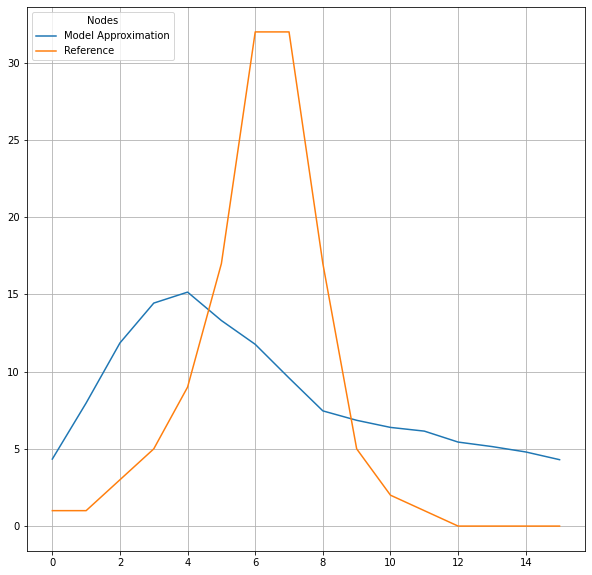

Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:31<00:00,  3.22it/s]

Best RMSE located : 9.33 at: beta=0.1 k=5 ro=0


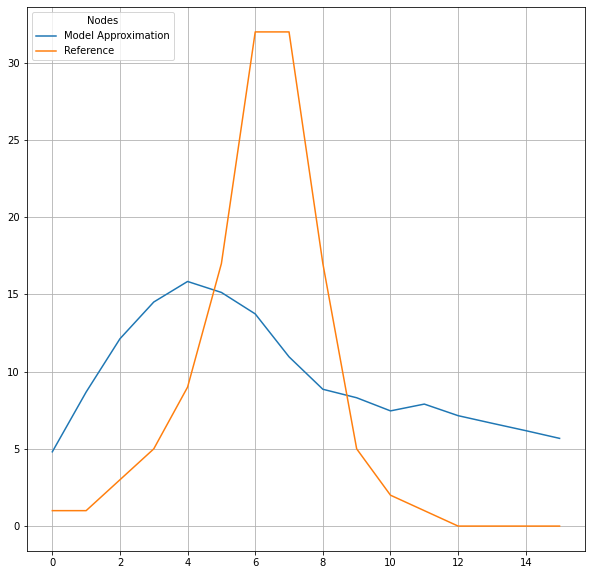

Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.1


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

updating precision
Starting Parameters with k=5, beta=0.1, ro=0.1


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Moving Local Optima
Starting Parameters with k=5, beta=0.1, ro=0.05


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

updating precision
Starting Parameters with k=5, beta=0.1, ro=0.05


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:36<00:00,  2.73it/s]

updating precision
EXIT


In [2]:
best = GradientOptimizer(k=10, beta=0.3, ro=0.6, step_k=2, step_beta=0.1, step_ro=0.1)

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Starting Parameters with k=4, beta=0.3, ro=0.6


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:30<00:00,  3.28it/s]

Best RMSE located : 12.1 at: beta=0.2 k=4 ro=0.5


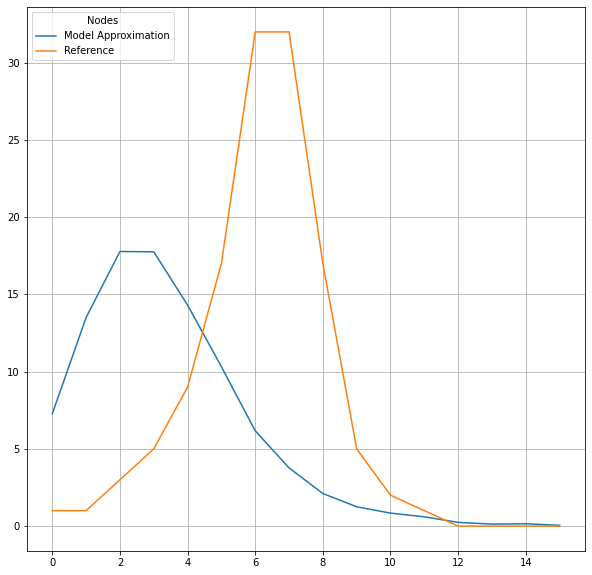

Moving Local Optima
Starting Parameters with k=4, beta=0.2, ro=0.5


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:29<00:00,  3.44it/s]

Best RMSE located : 11 at: beta=0.1 k=6 ro=0.4


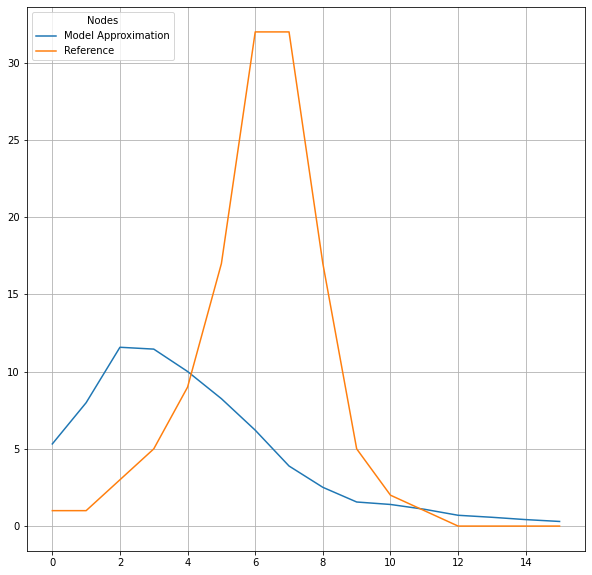

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.4


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:35<00:00,  2.79it/s]

Best RMSE located : 10.4 at: beta=0.1 k=6 ro=0.3


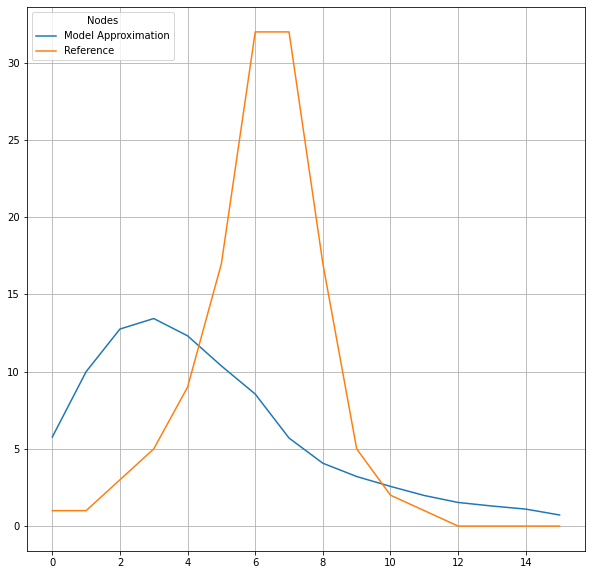

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.3


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:34<00:00,  2.89it/s]

Best RMSE located : 9.89 at: beta=0.1 k=6 ro=0.2


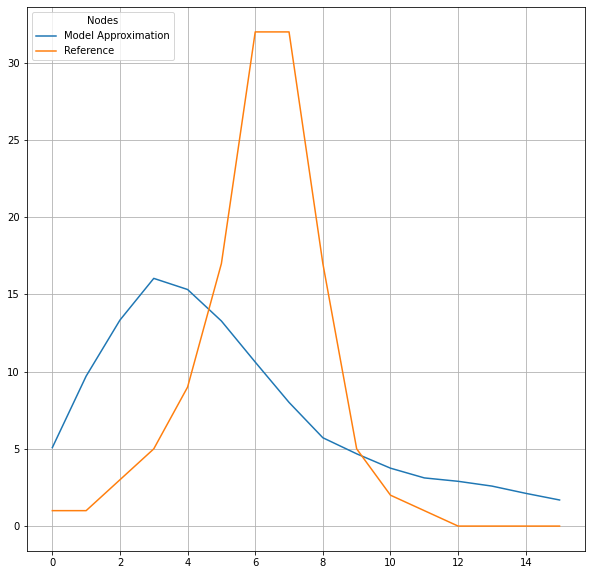

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.2


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:33<00:00,  3.02it/s]

Best RMSE located : 9.84 at: beta=0.1 k=6 ro=0.1


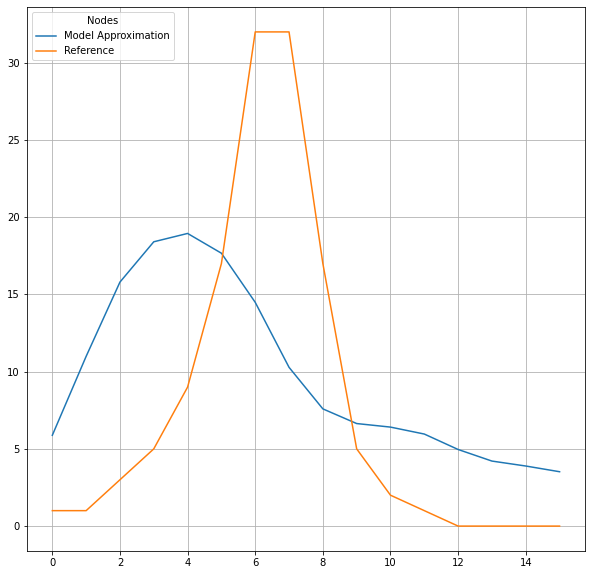

Moving Local Optima
Starting Parameters with k=6, beta=0.1, ro=0.1


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:33<00:00,  2.97it/s]

Best RMSE located : 9.8 at: beta=0.1 k=4 ro=2.78e-17


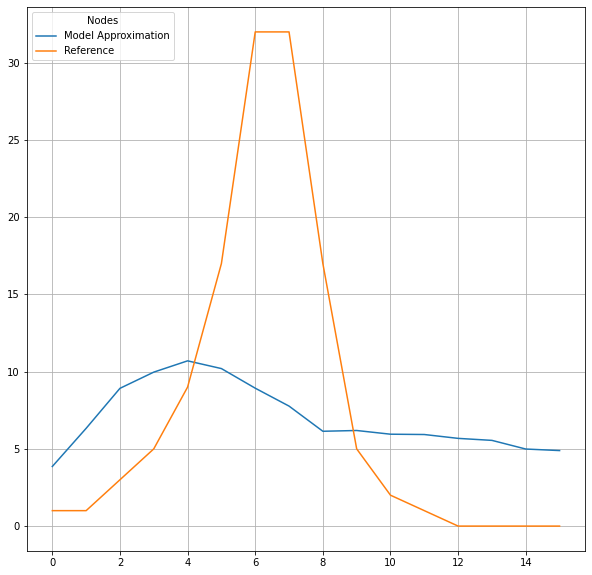

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Moving Local Optima
Starting Parameters with k=4, beta=0.1, ro=2.78e-17


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:32<00:00,  3.04it/s]

Best RMSE located : 9.7 at: beta=0.1 k=4 ro=2.78e-17


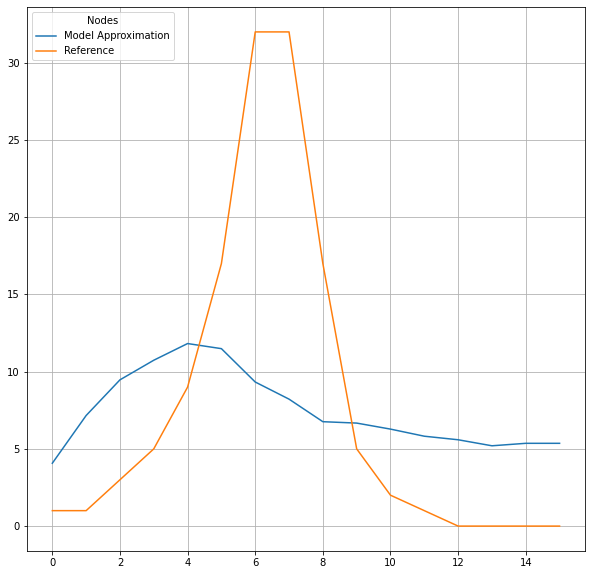

updating precision
Starting Parameters with k=4, beta=0.1, ro=2.78e-17


 43%|██████████████████████████████████▊                                              | 43/100 [00:21<00:28,  2.01it/s]


KeyboardInterrupt: 

In [3]:
best = GradientOptimizer(k=4, beta=0.3, ro=0.6, step_k=2, step_beta=0.1, step_ro=0.1)

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Starting Parameters with k=8, beta=0.3, ro=0.6


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:33<00:00,  2.99it/s]

Best RMSE located : 9.88 at: k=4 beta=0.2 ro=0.8


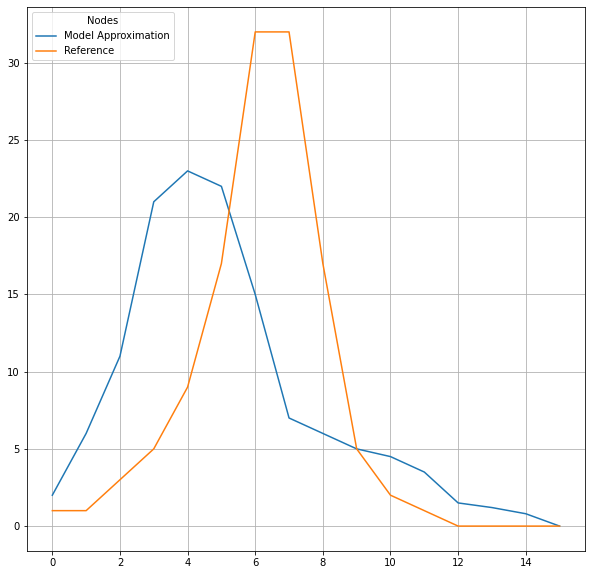

Moving Local Optima 
 Starting Parameters with k=6, beta=0.3, ro=0.6


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:33<00:00,  2.99it/s]

Best RMSE located : 9.82 at: k=4 beta=0.45 ro=0.5


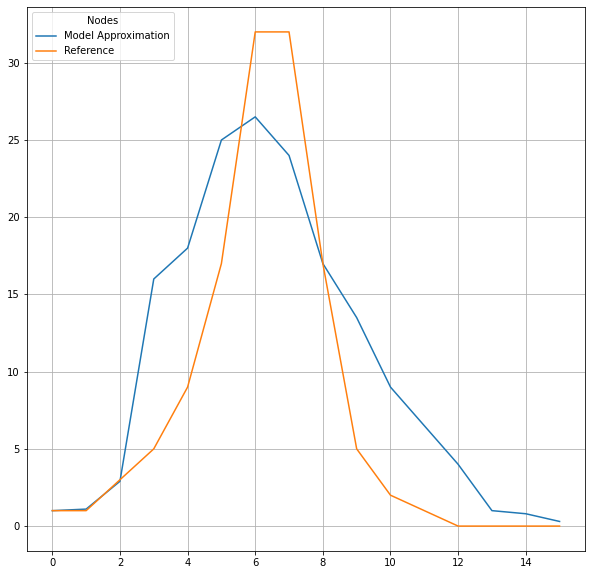

Moving Local Optima 
 Starting Parameters with k=5, beta=0.45, ro=0.5


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:33<00:00,  2.95it/s]

Best RMSE located : 9.7 at: k=5 beta=0.45 ro=0.25


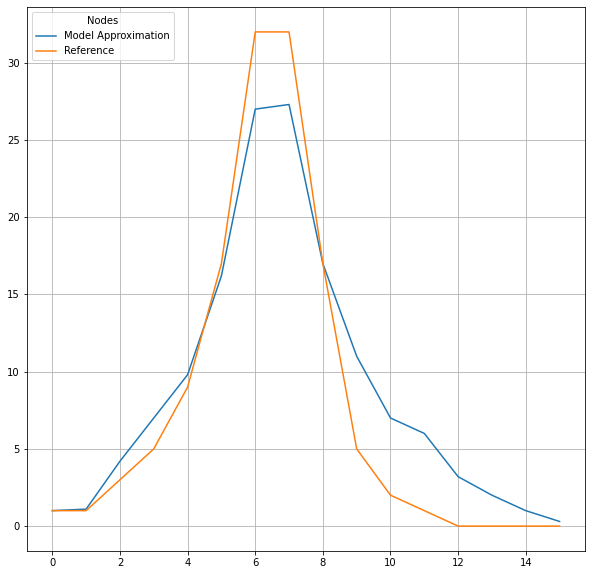

EXIT


In [20]:
best = GradientOptimizer(k=8, beta=0.3, ro=0.6, step_k=2, step_beta=0.1, step_ro=0.1)